In [1]:
import numpy as np
import pandas as pd
import time
import sys
import os
from joblib import Parallel, delayed
sys.path.append('../')
from packages import actv_analysis, svm, load_csv, stats, objects
import pickle

# from IPython.core.display import display, HTML
# display(HTML("<style>.container { width:100% !important; }</style>"))

In [ ]:
min_sz_idx=3
max_sz_idx=9 
min_num_idx=0
max_num_idx=9
numbers=range(2,21,2)
sizes=range(4,14)
PN=[]
PS=[]

units, avg_response_vectors = actv_analysis.get_selective_units(net=1, relu=5, epoch=0, min_sz_idx=min_sz_idx, max_sz_idx=max_sz_idx, PN=PN,PS=PS)

In [ ]:
net=1; relu=5; epoch=0;

actv_net = actv_analysis.get_actv_net(net=1, relu=5, epoch=0)
    
# Load units
with open(f'network{net}_Relu{relu}_epoch{epoch}.pkl', 'rb') as f:
    units = pickle.load(f)

In [ ]:
# Subset actv_net based on size range
if min_sz_idx != max_sz_idx:
    take = np.arange(0,100).reshape(10,10)[:,min_sz_idx:max_sz_idx+1].reshape(len(numbers)*(max_sz_idx-min_sz_idx+1))
else:
    take = np.arange(0,100).reshape(10,10)[:,min_sz_idx:max_sz_idx+1].flatten()

actv_szAtoB = actv_net[:,take,:]

# Calculate response rates
response_rate = np.mean(actv_szAtoB > 0, axis=(1, 2))

In [ ]:
p_val = 0.01
selective_units = [unit for unit in units if (unit.anova2_numbers is not None and unit.anova2_numbers < p_val) and 
                                           (unit.anova2_sizes is not None and unit.anova2_sizes < p_val)]

In [ ]:
selective_units

In [ ]:
from joblib import Parallel, delayed

results = []
for relu in range(2,3):
    for epoch in range(0,91,10):
        labels = stats.generate_labels()
        cos_sim_matrix = stats.cos_similarity(relu, epoch)  # Assume relu and epoch are defined
        stats.plot_mds(cos_sim_matrix, relu, epoch, labels=labels)

## MDS + PCA

In [2]:
from sklearn.manifold import MDS
from sklearn.decomposition import PCA
import numpy as np
import joblib

# Instantiate PCA and MDS
pca = PCA(n_components=2)
mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)

xmin, ymin, xmax, ymax = None, None, None, None

for relu in range(2,6):
    for epoch in range(90,-1,-10):  # go backwards in epochs
        print(f'relu{relu} epoch{epoch}')
        labels = stats.generate_labels()
        cos_sim_matrix = stats.cos_similarity(relu, epoch)  # Assume relu and epoch are defined

        # Perform MDS
        mds_results = mds.fit_transform(1 - cos_sim_matrix)  # convert similarity to dissimilarity

        # Perform PCA on MDS results
        pca_results = pca.fit_transform(mds_results)

        # Update the min/max values
        if xmin is None:
            xmin, ymin = np.min(pca_results, axis=0)
            xmax, ymax = np.max(pca_results, axis=0)
        else:
            xmin, ymin = np.minimum((xmin, ymin), np.min(pca_results, axis=0))
            xmax, ymax = np.maximum((xmax, ymax), np.max(pca_results, axis=0))
        
        # Save MDS results, PCA results, and labels
        joblib.dump((mds_results, pca_results, labels, (xmin, xmax), (ymin, ymax)), f'MDS_PCA_results_relu{relu}_epoch{epoch}.pkl')

print("All MDS and PCA results saved.")

relu2 epoch90
--- 335.1137020587921 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu2 epoch80
--- 318.7988522052765 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu2 epoch70
--- 312.09694504737854 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu2 epoch60
--- 310.48085713386536 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu2 epoch50
--- 301.4013452529907 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu2 epoch40
--- 297.33102083206177 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu2 epoch30
--- 281.17028403282166 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu2 epoch20
--- 266.71828985214233 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu2 epoch10
--- 269.5936131477356 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu2 epoch0
--- 358.8320119380951 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu3 epoch90
--- 89.9865300655365 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu3 epoch80
--- 88.00447392463684 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu3 epoch70
--- 87.06275582313538 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu3 epoch60
--- 83.06623530387878 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu3 epoch50
--- 80.71706199645996 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu3 epoch40
--- 76.50128388404846 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu3 epoch30
--- 70.04577994346619 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu3 epoch20
--- 70.75735306739807 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu3 epoch10
--- 70.82306170463562 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu3 epoch0
--- 111.09031224250793 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu4 epoch90
--- 100.34763598442078 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu4 epoch80
--- 98.57760214805603 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu4 epoch70
--- 97.63198208808899 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu4 epoch60
--- 91.6455090045929 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu4 epoch50
--- 91.94855904579163 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu4 epoch40
--- 86.34935212135315 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu4 epoch30
--- 77.49160599708557 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu4 epoch20
--- 73.41669917106628 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu4 epoch10
--- 74.01485586166382 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu4 epoch0
--- 109.3391900062561 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu5 epoch90
--- 57.80808401107788 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu5 epoch80
--- 57.785699129104614 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu5 epoch70
--- 58.805946826934814 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu5 epoch60
--- 56.97864508628845 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu5 epoch50
--- 57.805798053741455 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu5 epoch40
--- 58.45382809638977 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu5 epoch30
--- 55.17474603652954 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu5 epoch20
--- 54.56490206718445 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu5 epoch10
--- 54.05279517173767 seconds ---


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


relu5 epoch0
--- 88.55794191360474 seconds ---
All MDS and PCA results saved.


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


## Representation similarity matrix

/var/folders/yq/vnn1qzt56k7041vctbsfrxj40000gn/T/ipykernel_1601/1116197986.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = plt.cm.get_cmap('magma')


Processing relu2...
Epoch 0
--- 591.4380207061768 seconds ---
Epoch 10
--- 422.1963560581207 seconds ---
Epoch 20
--- 416.08745288848877 seconds ---
Epoch 30
--- 433.881098985672 seconds ---
Epoch 40
--- 485.4968888759613 seconds ---
Epoch 50
--- 459.7167179584503 seconds ---
Epoch 60
--- 481.50099778175354 seconds ---
Epoch 70
--- 506.0330898761749 seconds ---
Epoch 80
--- 483.9919238090515 seconds ---
Epoch 90
--- 502.75517988204956 seconds ---
Done processing relu2
Processing relu3...
Epoch 0
--- 185.2611882686615 seconds ---
Epoch 10
--- 93.75745296478271 seconds ---
Epoch 20
--- 83.42137694358826 seconds ---
Epoch 30
--- 126.91789126396179 seconds ---
Epoch 40
--- 132.97620296478271 seconds ---
Epoch 50
--- 146.61719512939453 seconds ---
Epoch 60
--- 143.5843939781189 seconds ---
Epoch 70
--- 153.74359822273254 seconds ---
Epoch 80
--- 153.37459301948547 seconds ---
Epoch 90
--- 153.98727869987488 seconds ---
Done processing relu3
Processing relu4...
Epoch 0
--- 199.75787782669067

/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu2 epoch10


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu2 epoch20


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu2 epoch30


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu2 epoch40


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu2 epoch50


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu2 epoch60


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu2 epoch70


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu2 epoch80
Plotting relu2 epoch90


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


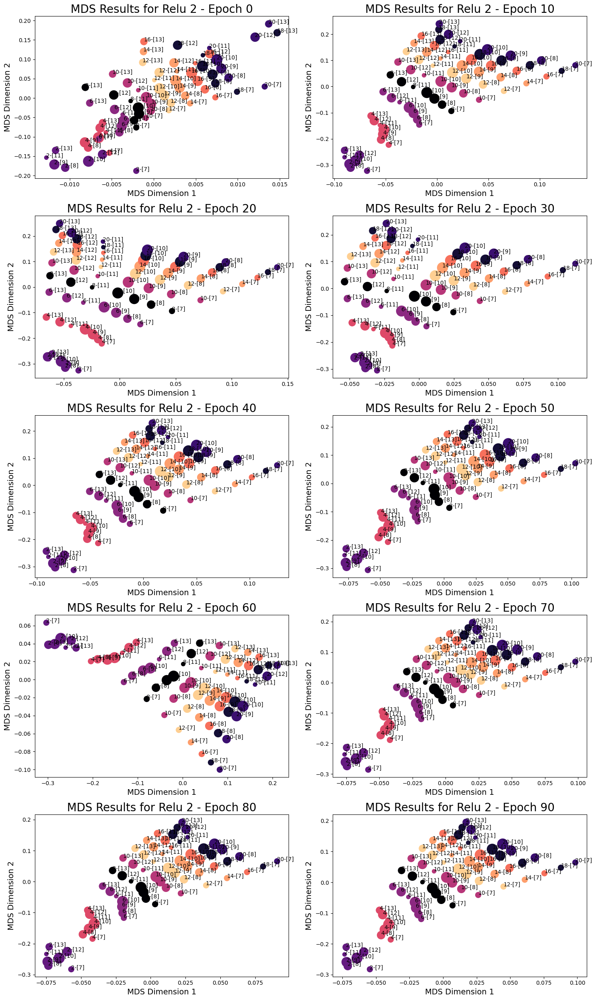

Plotting heatmap for relu2 epoch0
Plotting heatmap for relu2 epoch10
Plotting heatmap for relu2 epoch20
Plotting heatmap for relu2 epoch30
Plotting heatmap for relu2 epoch40
Plotting heatmap for relu2 epoch50
Plotting heatmap for relu2 epoch60
Plotting heatmap for relu2 epoch70
Plotting heatmap for relu2 epoch80
Plotting heatmap for relu2 epoch90


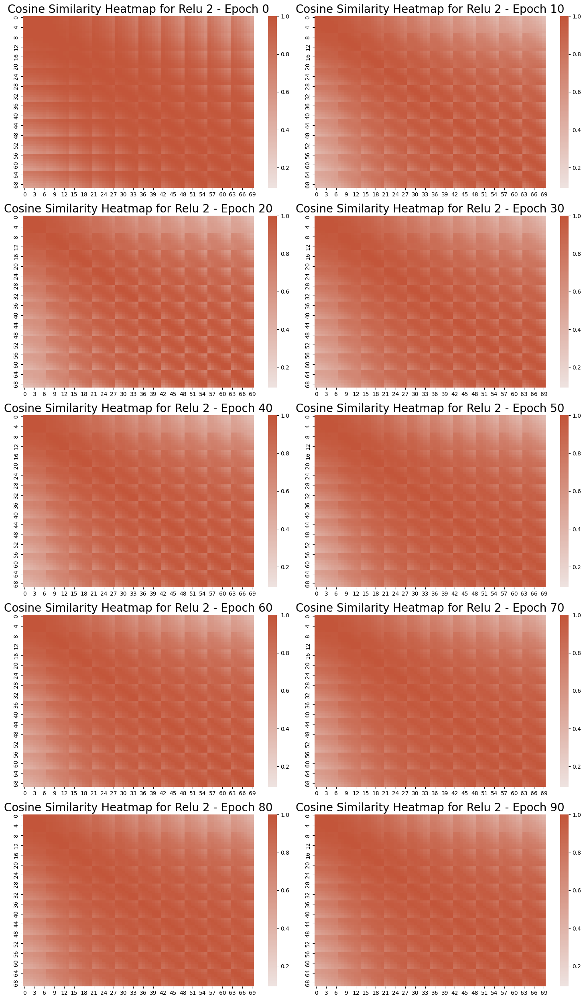

Plotting relu3 epoch0


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu3 epoch10


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu3 epoch20


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu3 epoch30


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu3 epoch40
Plotting relu3 epoch50


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu3 epoch60


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu3 epoch70


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu3 epoch80


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu3 epoch90


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


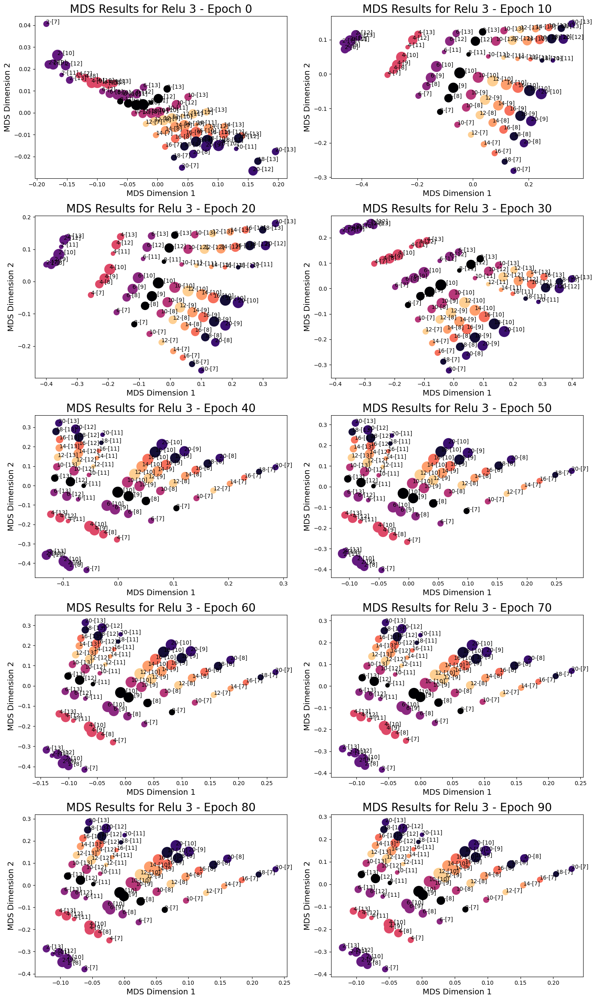

Plotting heatmap for relu3 epoch0
Plotting heatmap for relu3 epoch10
Plotting heatmap for relu3 epoch20
Plotting heatmap for relu3 epoch30
Plotting heatmap for relu3 epoch40
Plotting heatmap for relu3 epoch50
Plotting heatmap for relu3 epoch60
Plotting heatmap for relu3 epoch70
Plotting heatmap for relu3 epoch80
Plotting heatmap for relu3 epoch90


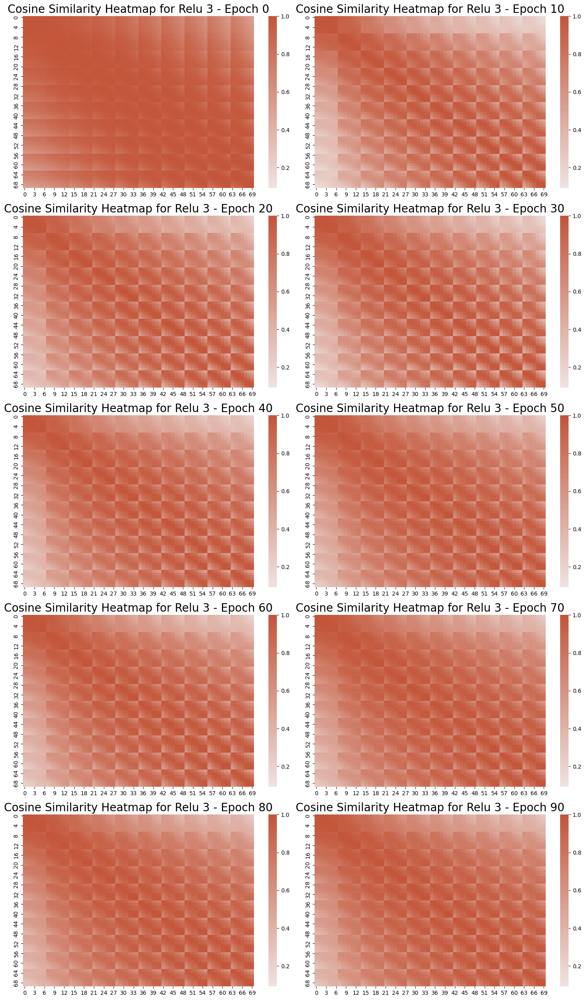

Plotting relu4 epoch0


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu4 epoch10


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu4 epoch20


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu4 epoch30


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu4 epoch40
Plotting relu4 epoch50


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu4 epoch60


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu4 epoch70


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu4 epoch80


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu4 epoch90


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


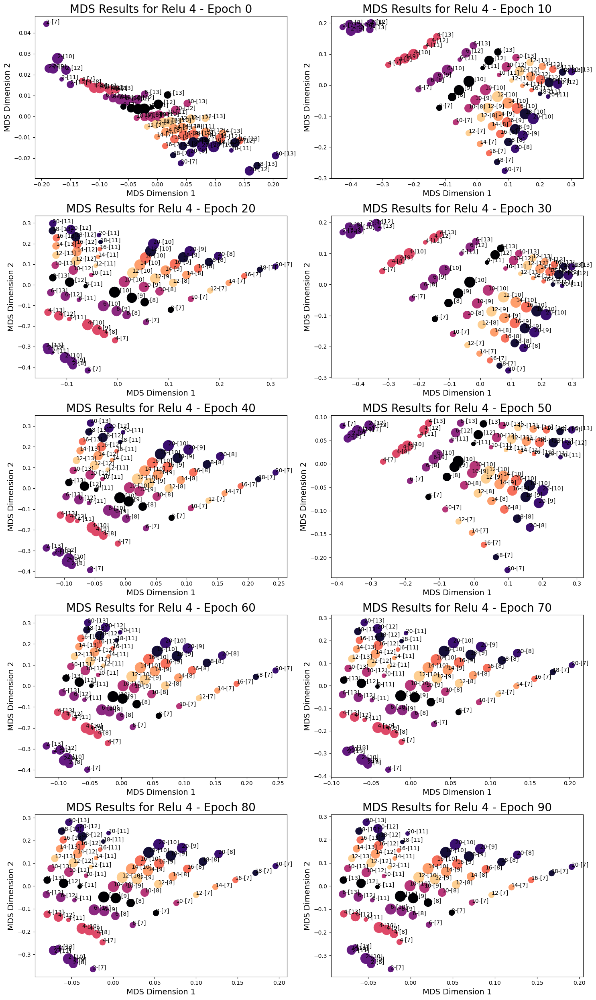

Plotting heatmap for relu4 epoch0
Plotting heatmap for relu4 epoch10
Plotting heatmap for relu4 epoch20
Plotting heatmap for relu4 epoch30
Plotting heatmap for relu4 epoch40
Plotting heatmap for relu4 epoch50
Plotting heatmap for relu4 epoch60
Plotting heatmap for relu4 epoch70
Plotting heatmap for relu4 epoch80
Plotting heatmap for relu4 epoch90


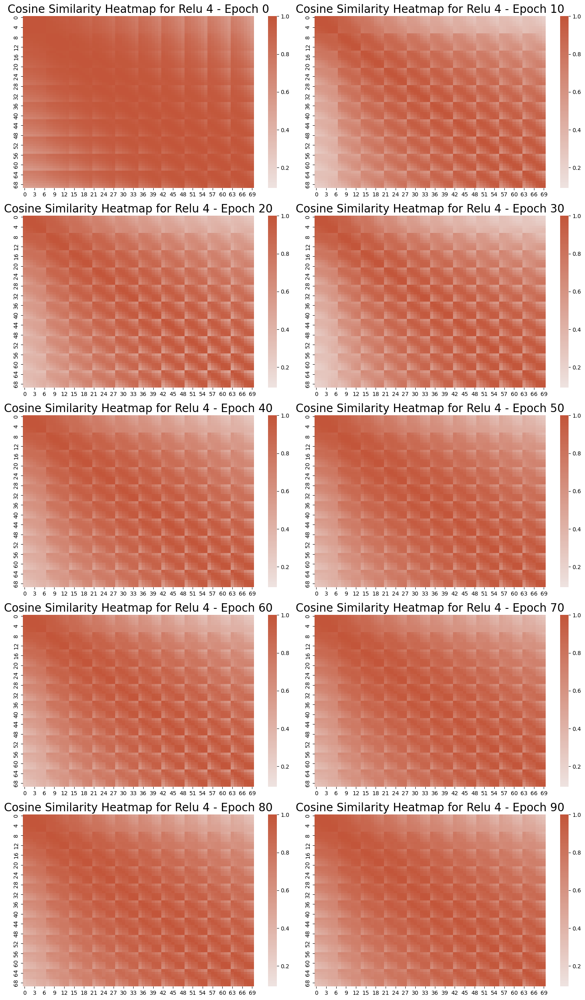

Plotting relu5 epoch0


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu5 epoch10


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu5 epoch20


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu5 epoch30


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu5 epoch40


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu5 epoch50


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu5 epoch60


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu5 epoch70


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu5 epoch80


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu5 epoch90


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


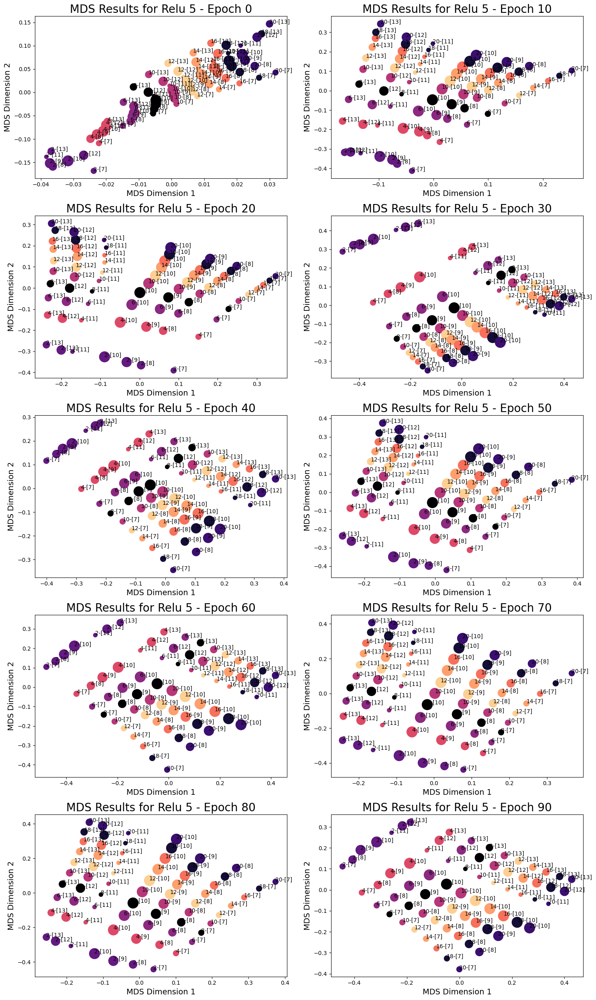

Plotting heatmap for relu5 epoch0
Plotting heatmap for relu5 epoch10
Plotting heatmap for relu5 epoch20
Plotting heatmap for relu5 epoch30
Plotting heatmap for relu5 epoch40
Plotting heatmap for relu5 epoch50
Plotting heatmap for relu5 epoch60
Plotting heatmap for relu5 epoch70
Plotting heatmap for relu5 epoch80
Plotting heatmap for relu5 epoch90


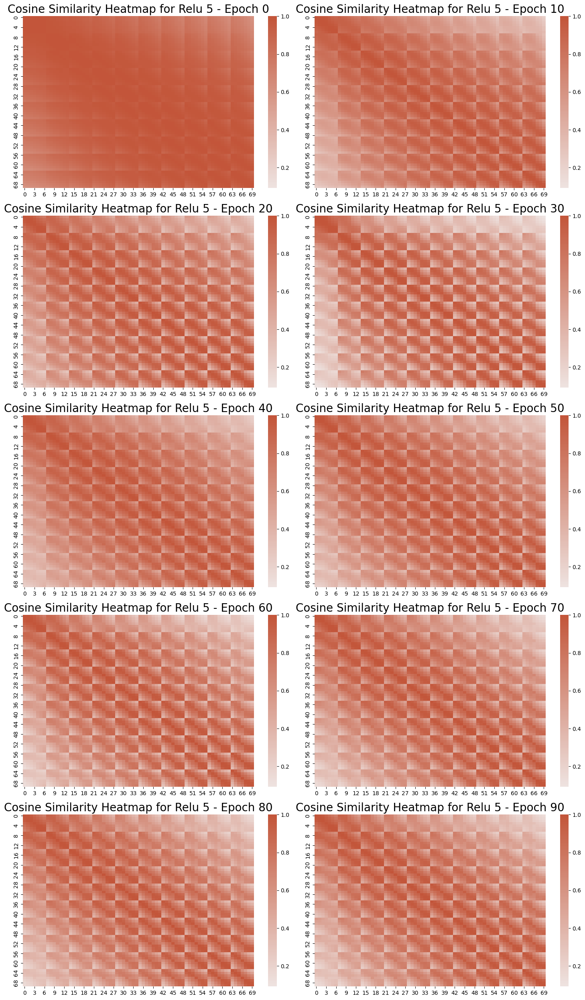

Done creating plots


In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import MDS
import numpy as np
import joblib

# Color map for heatmap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Color map for MDS
color_map = plt.cm.get_cmap('magma')

# Prepare unique labels and sizes
unique_labels = list(set(stats.generate_labels()))  # Assume stats.generate_labels() returns a list of labels
unique_numbers = {label.split('-')[0] for label in unique_labels}
unique_sizes = {label.split('-')[1] for label in unique_labels}

# Map number to color and size to point size
color_map = {int(number): color_map(i/len(unique_numbers)) for i, number in enumerate(unique_numbers)}
size_map = {size: (i+1)*50 for i, size in enumerate(unique_sizes)}  # Multiply by 50 to increase the dot size

# Variables to store overall min and max cosine similarity values
min_val, max_val = np.inf, -np.inf

for relu in range(2,6):
    print(f'Processing relu{relu}...')
    
    for i, epoch in enumerate(range(0, 91, 10)):  # go forwards in epochs
        print(f'Epoch {epoch}')
        labels = stats.generate_labels()
        cos_sim_matrix = stats.cos_similarity(relu, epoch)  # Calculate cosine similarity matrix

        # Update min and max values
        min_val = min(min_val, np.min(cos_sim_matrix))
        max_val = max(max_val, np.max(cos_sim_matrix))

        # Save cosine similarity matrix
        joblib.dump(cos_sim_matrix, f'cos_sim_matrix_relu{relu}_epoch{epoch}.pkl')

    print(f'Done processing relu{relu}')

print('Done processing all relus')

print('Creating plots...')

for relu in range(2,6):
    # Create figure for subplots
    fig, axs = plt.subplots(5, 2, figsize=(15, 25))

    for i, epoch in enumerate(range(0, 91, 10)):  # go forwards in epochs
        print(f'Plotting relu{relu} epoch{epoch}')
        labels = stats.generate_labels()
        cos_sim_matrix = joblib.load(f'cos_sim_matrix_relu{relu}_epoch{epoch}.pkl')  # Load cosine similarity matrix

        # Perform MDS
        mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
        mds_results = mds.fit_transform(1 - cos_sim_matrix)  # Subtract from 1 to convert similarity to dissimilarity

        # Plot raw MDS results with color and size variations
        ax = axs[i // 2, i % 2]  # Determine subplot position
        for j, label in enumerate(labels):
            number, size = label.split('-')  # separate number and size from label
            color = color_map[int(number)]  # get color from color map
            ax.scatter(mds_results[j, 0], mds_results[j, 1], color=color, s=size_map[size])  # Scatter plot of MDS results
            ax.annotate(f'{number}-{size}', (mds_results[j, 0], mds_results[j, 1]))  # annotate the data point

        # Set title, labels
        ax.set_title(f'MDS Results for Relu {relu} - Epoch {epoch}', fontsize=20)
        ax.set_xlabel('MDS Dimension 1', fontsize=14)
        ax.set_ylabel('MDS Dimension 2', fontsize=14)

    plt.tight_layout()
    plt.savefig(f'MDS_Results_relu{relu}.pdf')
    plt.show()

    # Plot cosine similarity matrix as a heatmap in a separate figure
    fig, axs = plt.subplots(5, 2, figsize=(15, 25))

    for i, epoch in enumerate(range(0, 91, 10)):  # go forwards in epochs
        print(f'Plotting heatmap for relu{relu} epoch{epoch}')
        cos_sim_matrix = joblib.load(f'cos_sim_matrix_relu{relu}_epoch{epoch}.pkl')  # Load cosine similarity matrix

        # Plot cosine similarity matrix as a heatmap
        ax = axs[i // 2, i % 2]  # Determine subplot position
        sns.heatmap(cos_sim_matrix, cmap=cmap, vmin=min_val, vmax=max_val, center=0, ax=ax)  # Use overall min and max values
        ax.set_title(f'Cosine Similarity Heatmap for Relu {relu} - Epoch {epoch}', fontsize=20)

    plt.tight_layout()
    plt.savefig(f'Cosine_Similarity_Heatmap_relu{relu}.pdf')
    plt.show()

print('Done creating plots')

## Plot PCA result

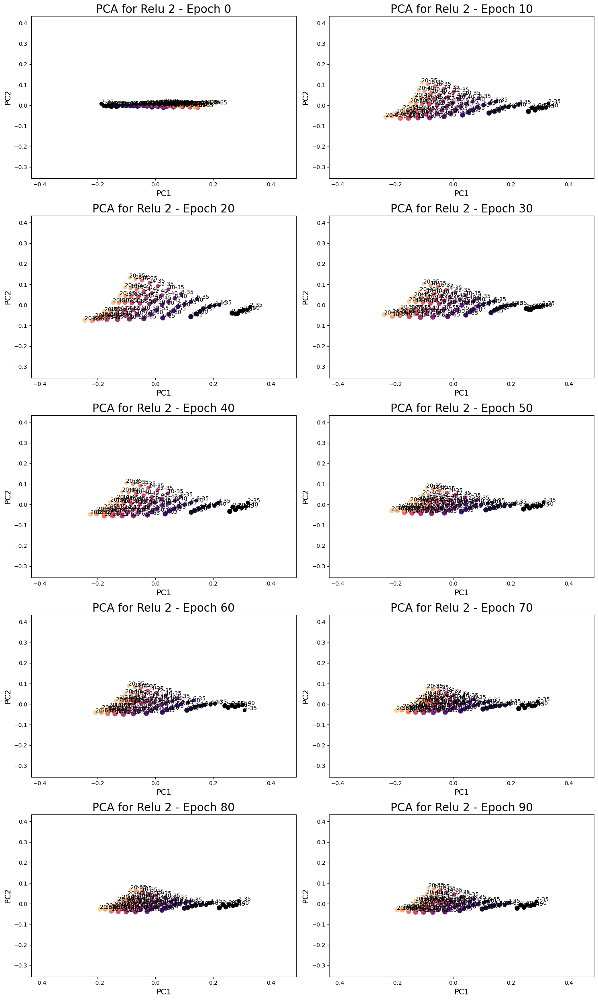

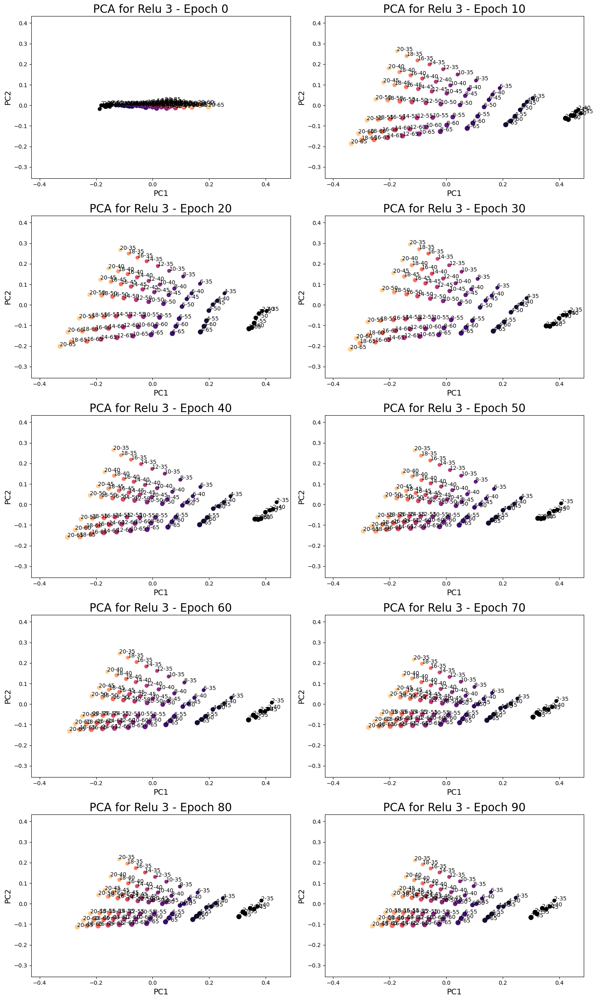

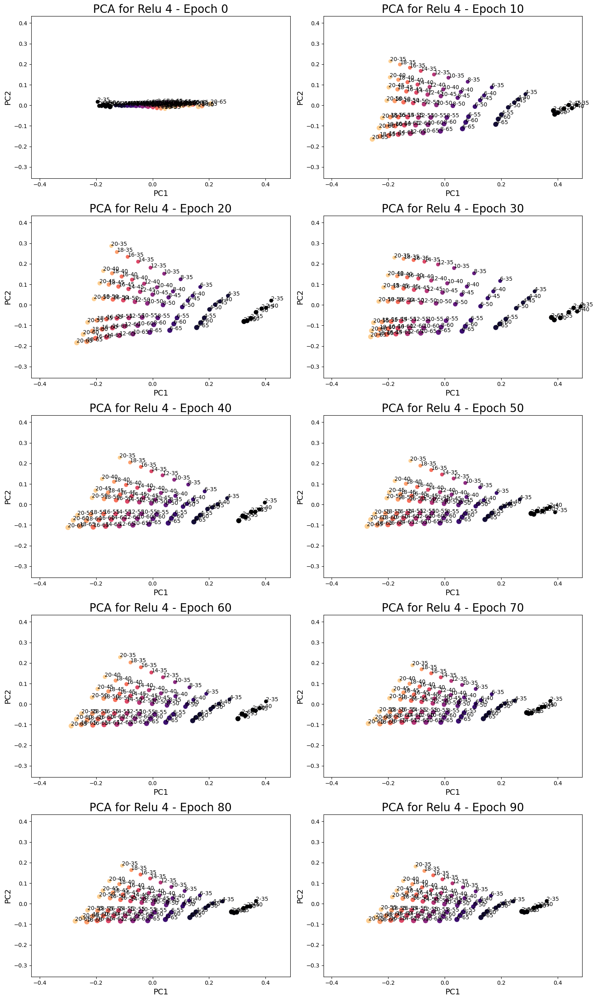

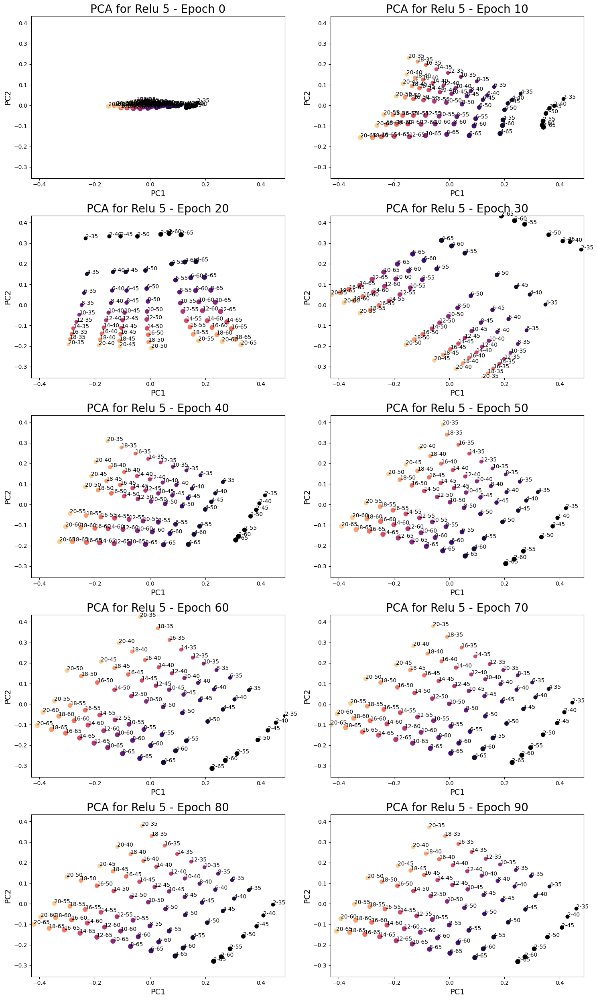

In [17]:
import matplotlib.pyplot as plt
import joblib
import numpy as np

# Load all the results
results = []
for relu in range(2, 6):
    for epoch in range(0, 91, 10):  
        result = joblib.load(f'MDS_PCA_results_relu{relu}_epoch{epoch}.pkl')
        results.append(result)

# Compute the common x and y axes ranges
xmin = min(r[3][0] for r in results)
xmax = max(r[3][1] for r in results)
ymin = min(r[4][0] for r in results)
ymax = max(r[4][1] for r in results)

# Create figures for each relu
for relu in range(2, 6):
    fig, axs = plt.subplots(5, 2, figsize=(15, 25))
    for i, epoch in enumerate(range(0, 91, 10)):
        # Load the results
        mds_results, pca_results, labels, _, _ = joblib.load(f'MDS_PCA_results_relu{relu}_epoch{epoch}.pkl')

        # Create the subplot
        ax = axs[i // 2, i % 2]  # Determine subplot position

        # Create a colormap for each unique number in labels
        unique_numbers = sorted(set([int(label.split('-')[0]) for label in labels]))
        color_map = {number: plt.cm.magma(i/len(unique_numbers)) for i, number in enumerate(unique_numbers)}

        # Scatter plot of PCA results with color and annotation
        for j, label in enumerate(labels):
            number, size = label.split('-')  # separate number and size from label
            size = size.replace('[', '').replace(']', '')  # remove square brackets
            size = int(size) * 5  # convert size to integer and scale by a factor of 10
            color = color_map[int(number)]  # get color from color map
            ax.scatter(pca_results[j, 0], pca_results[j, 1], color=color, s=int(size))  # Scatter plot of PCA results
            ax.annotate(f'{number}-{size}', (pca_results[j, 0], pca_results[j, 1]))  # annotate the data point


        # Set title, labels
        ax.set_title(f'PCA for Relu {relu} - Epoch {epoch}', fontsize=20)
        ax.set_xlabel('PC1', fontsize=14)
        ax.set_ylabel('PC2', fontsize=14)

        # Set common scales
        ax.set_xlim(xmin, xmax)
        ax.set_ylim(ymin, ymax)

    # Adjust the layout and save the figure
    plt.tight_layout()
    plt.savefig(f'PCA_results_subplot_relu{relu}.pdf')
    plt.show()

/var/folders/yq/vnn1qzt56k7041vctbsfrxj40000gn/T/ipykernel_1601/3783294586.py:11: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  color_map = plt.cm.get_cmap('magma')
/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Calculating overall min and max cosine similarity values...


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(
/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in ver

Creating plots...
Plotting relu2 epoch0


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu2 epoch10


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu2 epoch20


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu2 epoch30


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu2 epoch40


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu2 epoch50


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu2 epoch60


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu2 epoch70


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu2 epoch80


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu2 epoch90


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


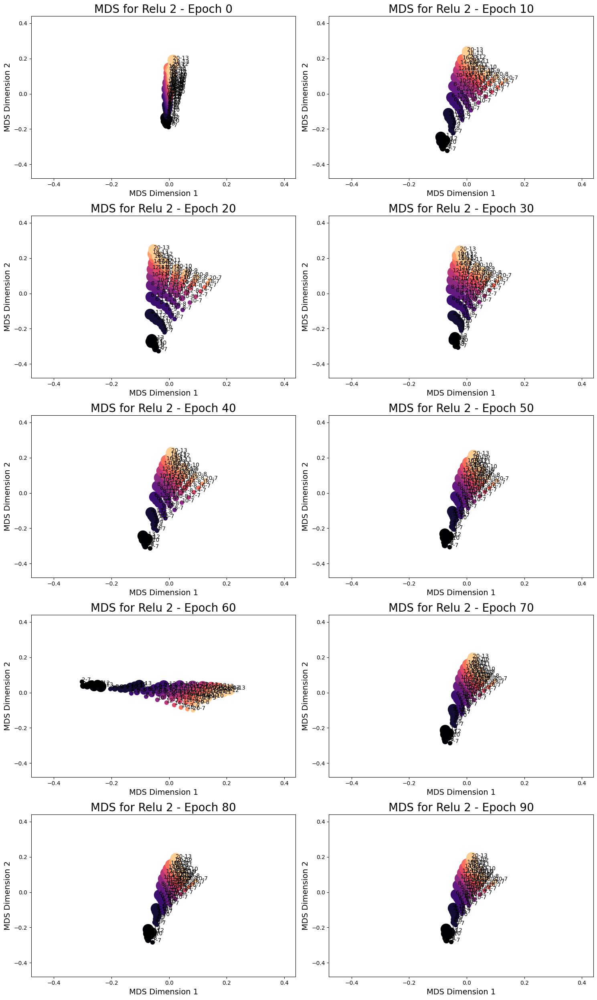

Plotting relu3 epoch0


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu3 epoch10


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu3 epoch20


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu3 epoch30


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu3 epoch40


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu3 epoch50


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu3 epoch60


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu3 epoch70


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu3 epoch80


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu3 epoch90


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


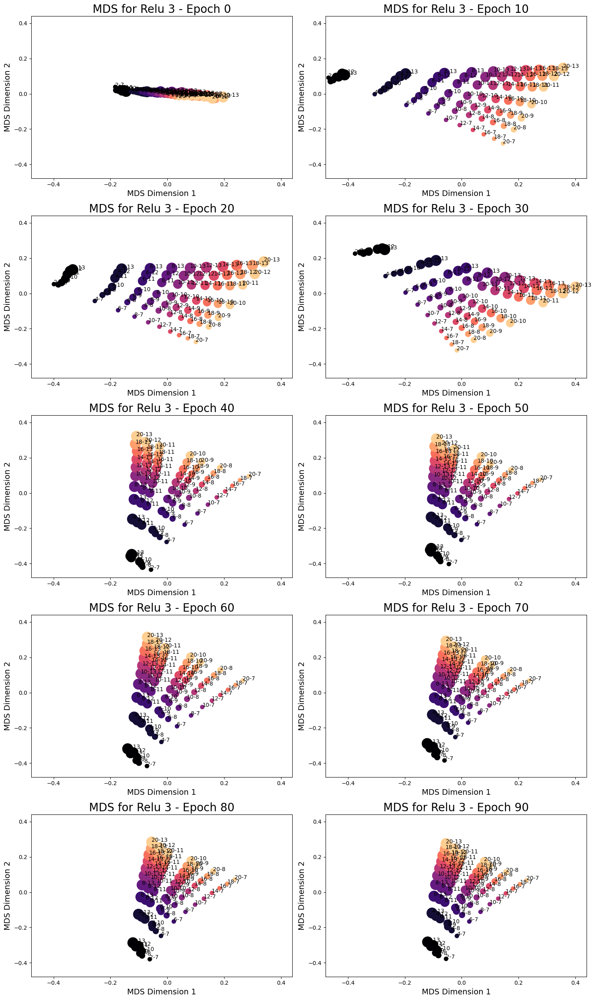

Plotting relu4 epoch0


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu4 epoch10


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu4 epoch20


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu4 epoch30


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu4 epoch40


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu4 epoch50


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu4 epoch60


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu4 epoch70


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu4 epoch80


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu4 epoch90


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


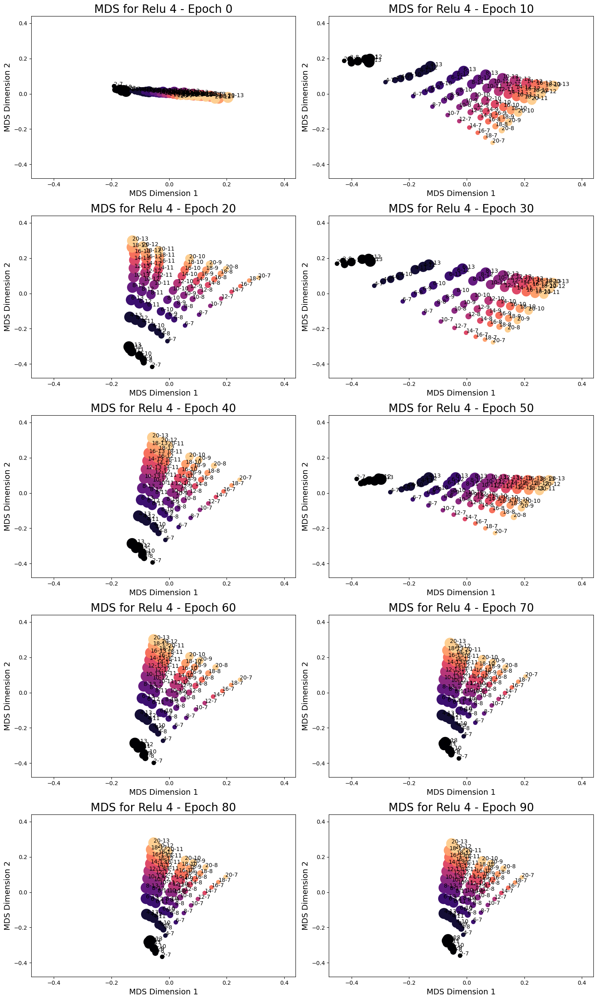

Plotting relu5 epoch0


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu5 epoch10


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu5 epoch20


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu5 epoch30


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu5 epoch40


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu5 epoch50


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu5 epoch60


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu5 epoch70


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu5 epoch80


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


Plotting relu5 epoch90


/Users/dongillee/opt/anaconda3/lib/python3.8/site-packages/sklearn/manifold/_mds.py:299: FutureWarning: The default value of `normalized_stress` will change to `'auto'` in version 1.4. To suppress this warning, manually set the value of `normalized_stress`.
  warnings.warn(


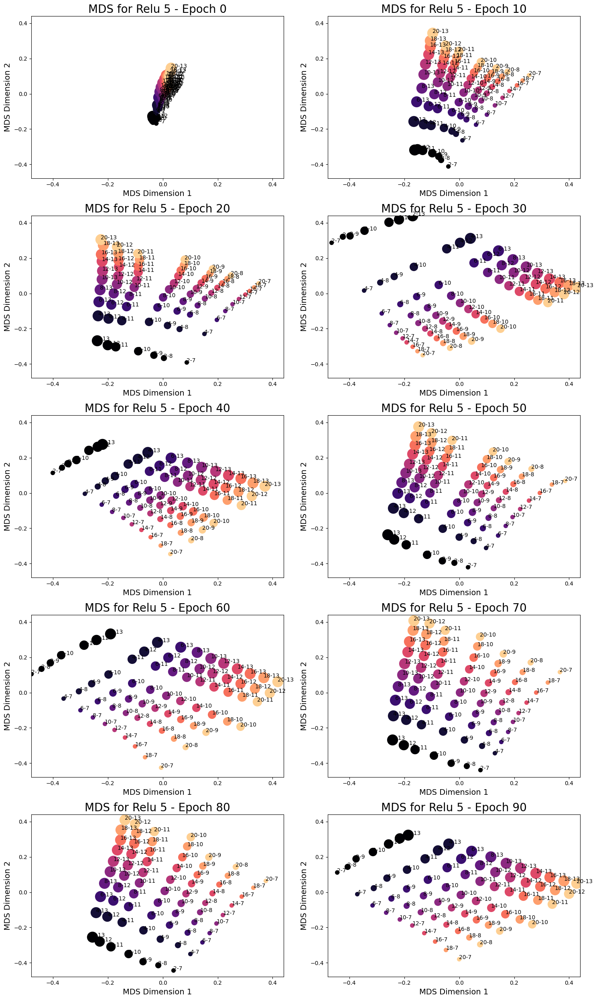

Plotting heatmap for relu2 epoch0
Plotting heatmap for relu2 epoch10
Plotting heatmap for relu2 epoch20
Plotting heatmap for relu2 epoch30
Plotting heatmap for relu2 epoch40
Plotting heatmap for relu2 epoch50
Plotting heatmap for relu2 epoch60
Plotting heatmap for relu2 epoch70
Plotting heatmap for relu2 epoch80
Plotting heatmap for relu2 epoch90


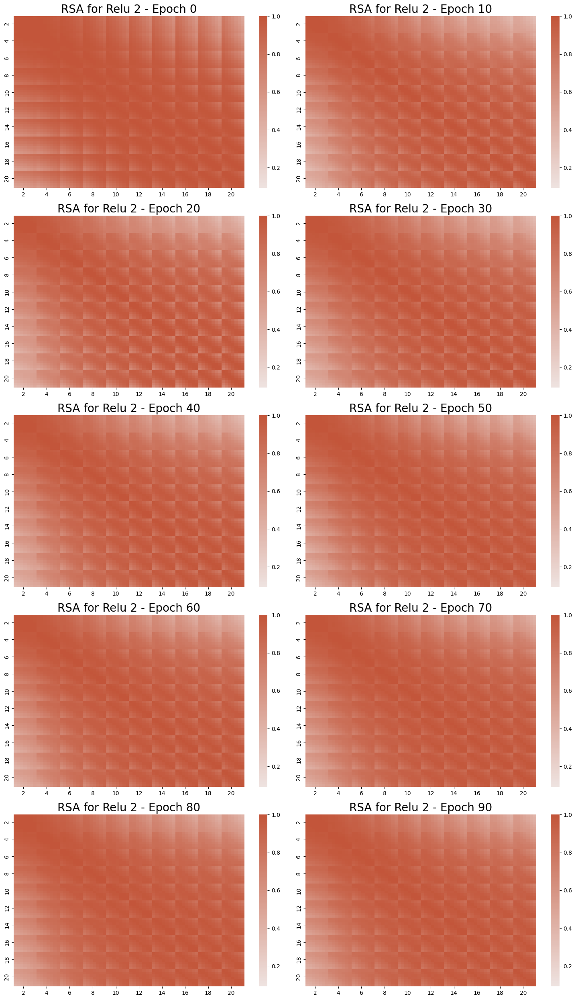

Plotting heatmap for relu3 epoch0
Plotting heatmap for relu3 epoch10
Plotting heatmap for relu3 epoch20
Plotting heatmap for relu3 epoch30
Plotting heatmap for relu3 epoch40
Plotting heatmap for relu3 epoch50
Plotting heatmap for relu3 epoch60
Plotting heatmap for relu3 epoch70
Plotting heatmap for relu3 epoch80
Plotting heatmap for relu3 epoch90


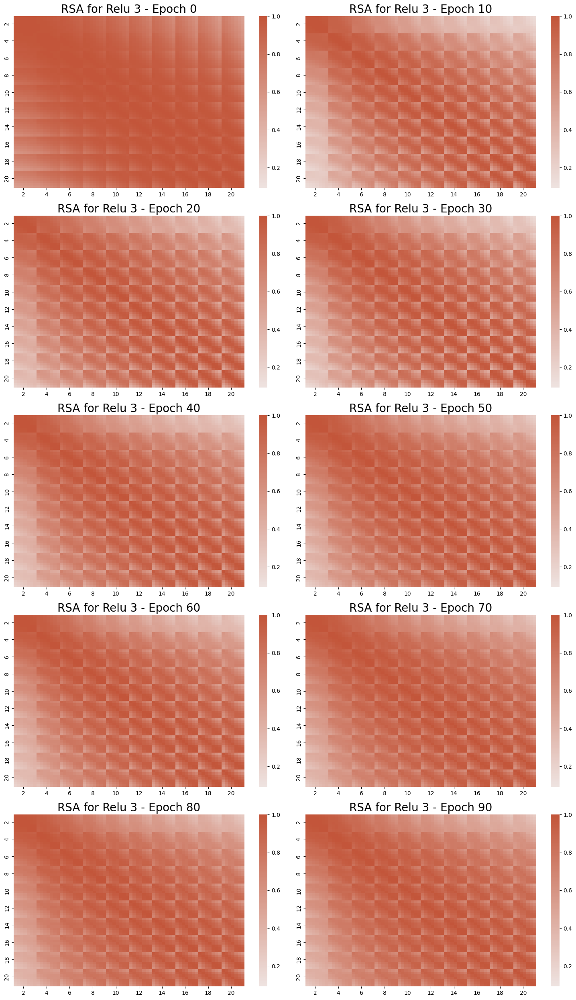

Plotting heatmap for relu4 epoch0
Plotting heatmap for relu4 epoch10
Plotting heatmap for relu4 epoch20
Plotting heatmap for relu4 epoch30
Plotting heatmap for relu4 epoch40
Plotting heatmap for relu4 epoch50
Plotting heatmap for relu4 epoch60
Plotting heatmap for relu4 epoch70
Plotting heatmap for relu4 epoch80
Plotting heatmap for relu4 epoch90


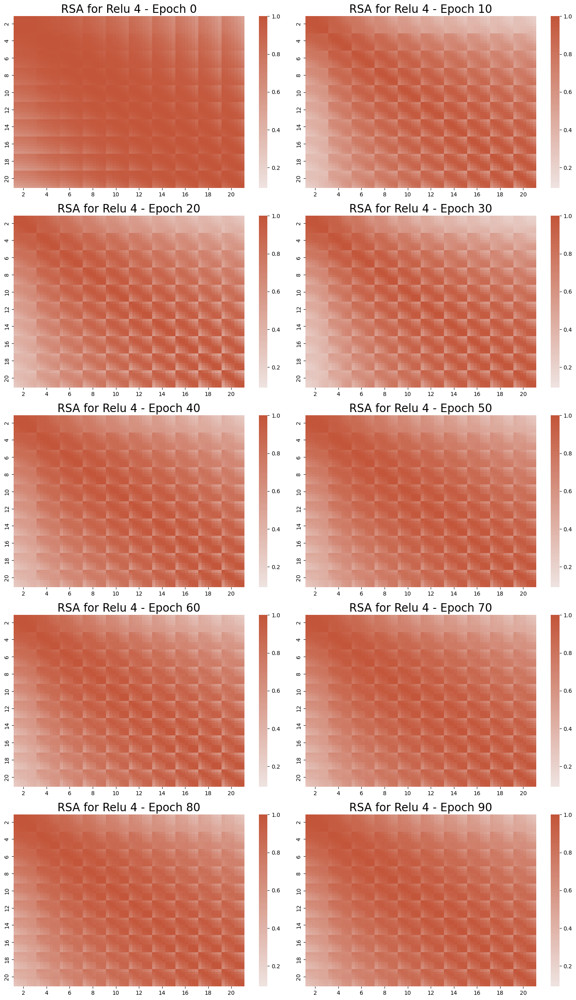

Plotting heatmap for relu5 epoch0
Plotting heatmap for relu5 epoch10
Plotting heatmap for relu5 epoch20
Plotting heatmap for relu5 epoch30
Plotting heatmap for relu5 epoch40
Plotting heatmap for relu5 epoch50
Plotting heatmap for relu5 epoch60
Plotting heatmap for relu5 epoch70
Plotting heatmap for relu5 epoch80
Plotting heatmap for relu5 epoch90


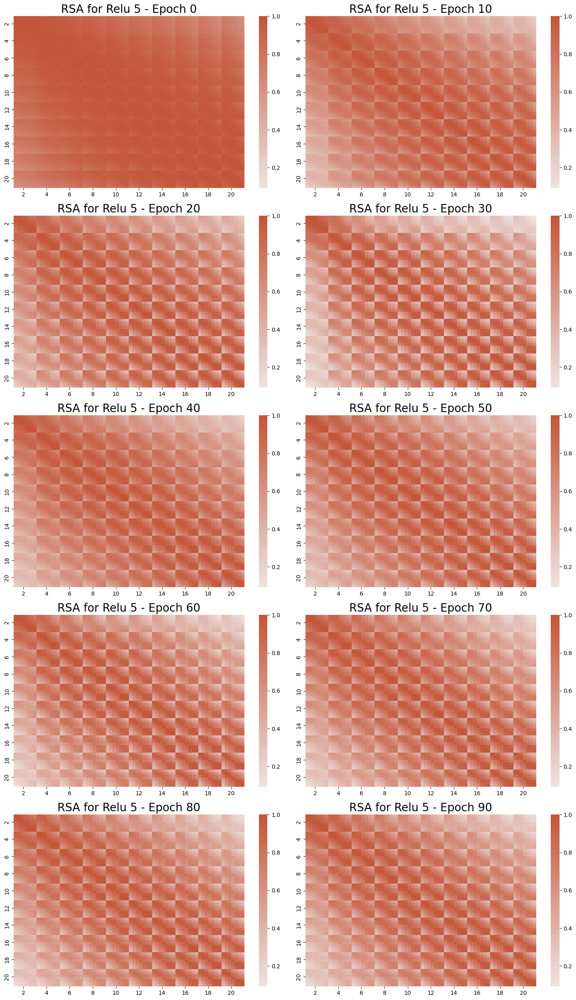

Done creating plots


In [31]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import MDS
import numpy as np
import joblib

# Color map for heatmap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Color map for MDS
color_map = plt.cm.get_cmap('magma')

# Prepare unique labels and sizes
unique_labels = list(set(stats.generate_labels()))  # Assume stats.generate_labels() returns a list of labels
unique_numbers = {int(label.split('-')[0]) for label in unique_labels}
# remove brackets before converting to int for size
unique_sizes = {int(label.split('-')[1].replace('[','').replace(']','')) for label in unique_labels}

# Map number to color and size to point size
color_map = {number: color_map(i/len(unique_numbers)) for i, number in enumerate(unique_numbers)}
size_map = {size: (i+1)*50 for i, size in enumerate(unique_sizes)}  # Multiply by 50 to increase the dot size

print('Calculating overall min and max cosine similarity values...')

min_val, max_val = np.inf, -np.inf
mds_min, mds_max = np.inf, -np.inf  # for MDS axes limits
for relu in range(2,6):
    for epoch in range(0, 91, 10):
        cos_sim_matrix = joblib.load(f'cos_sim_matrix_relu{relu}_epoch{epoch}.pkl')  # Load cosine similarity matrix
        min_val = min(min_val, cos_sim_matrix.min())
        max_val = max(max_val, cos_sim_matrix.max())

        # Perform MDS
        mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
        mds_results = mds.fit_transform(1 - cos_sim_matrix)  # Subtract from 1 to convert similarity to dissimilarity

        # Update MDS axes limits
        mds_min = min(mds_min, mds_results.min())
        mds_max = max(mds_max, mds_results.max())

print('Creating plots...')

for relu in range(2,6):
    # Create figure for subplots
    fig, axs = plt.subplots(5, 2, figsize=(15, 25))

    for i, epoch in enumerate(range(0, 91, 10)):  # go forwards in epochs
        print(f'Plotting relu{relu} epoch{epoch}')
        labels = stats.generate_labels()
        cos_sim_matrix = joblib.load(f'cos_sim_matrix_relu{relu}_epoch{epoch}.pkl')  # Load cosine similarity matrix

        # Perform MDS
        mds = MDS(n_components=2, dissimilarity='precomputed', random_state=42)
        mds_results = mds.fit_transform(1 - cos_sim_matrix)  # Subtract from 1 to convert similarity to dissimilarity

        # Plot raw MDS results with color and size variations
        ax = axs[i // 2, i % 2]  # Determine subplot position
        for j, label in enumerate(labels):
            number, size = label.split('-')  # separate number and size from label
            size = int(size.replace('[','').replace(']',''))  # remove brackets before converting to int
            color = color_map[int(number)]  # get color from color map
            ax.scatter(mds_results[j, 0], mds_results[j, 1], color=color, s=size_map[size])  # Scatter plot of MDS results
            ax.annotate(f'{number}-{size}', (mds_results[j, 0], mds_results[j, 1]))  # annotate the data point

        # Set title, labels, and limits
        ax.set_title(f'MDS for Relu {relu} - Epoch {epoch}', fontsize=20)
        ax.set_xlabel('MDS Dimension 1', fontsize=14)
        ax.set_ylabel('MDS Dimension 2', fontsize=14)
        ax.set_xlim([mds_min, mds_max])
        ax.set_ylim([mds_min, mds_max])

    plt.tight_layout()
    plt.savefig(f'MDS_Results_relu{relu}.pdf')
    plt.show()

for relu in range(2,6):
    # Create figure for cosine similarity heatmaps
    fig, axs = plt.subplots(5, 2, figsize=(15, 25))

    for i, epoch in enumerate(range(0, 91, 10)):  # go forwards in epochs
        print(f'Plotting heatmap for relu{relu} epoch{epoch}')
        cos_sim_matrix = joblib.load(f'cos_sim_matrix_relu{relu}_epoch{epoch}.pkl')  # Load cosine similarity matrix

        # Plot cosine similarity matrix as a heatmap
        ax = axs[i // 2, i % 2]  # Determine subplot position
        sns.heatmap(cos_sim_matrix, cmap=cmap, vmin=min_val, vmax=max_val, center=0, ax=ax)  # Use overall min and max values
        ax.set_title(f'RSA for Relu {relu} - Epoch {epoch}', fontsize=20)

        # Set tick locations and labels
        tick_locations = [i*7 + 3 for i in range(10)]  # The center of each group of 7
        tick_labels = [str(i) for i in range(2, 21, 2)]  # Here we set labels as numbers from 2 to 20, step size of 2
        ax.set_xticks(tick_locations)
        ax.set_yticks(tick_locations)
        ax.set_xticklabels(tick_labels)
        ax.set_yticklabels(tick_labels)

    plt.tight_layout()
    plt.savefig(f'RSA_relu{relu}.pdf')
    plt.show()

print('Done creating plots')